In [1]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams['text.latex.preamble'] = [
    r'\usepackage{amsmath}',
    r'\usepackage{amssymb}']
#matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif'] = 'Computer Modern'
#matplotlib.verbose.level = 'debug-annoying'

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 24}

matplotlib.rc('font', **font)

from mpl_toolkits.mplot3d import Axes3D
# from matplotlib import cbook
from matplotlib import cm
from matplotlib.colors import LightSource
from sklearn.svm import SVC, SVR
from sklearn import metrics
from sklearn.model_selection import train_test_split
import numpy as np
import scipy
from sklearn.neighbors.kde import KernelDensity
import itertools

import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

In [2]:
sims = pd.read_csv("summary_grid_data.csv")
sims['oscillations'] = sims['freq'] > 0

# Oscillations or not (log params)

In [3]:

oscillations = go.Scatter3d(
    x = sims.er[sims.oscillations],
    y = sims.mit[sims.oscillations],
    z = sims.ecs[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 10,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.er[~sims.oscillations],
    y = sims.mit[~sims.oscillations],
    z = sims.ecs[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 10,
        'opacity': 1,
        'color': 'rgba(255,0,0,0.1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='log(ecs)'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


# Calcium extrusion rate (out of cell)

In [4]:
# ER x MIT

oscillations = go.Scatter3d(
    x = sims.er[sims.oscillations],
    y = sims.mit[sims.oscillations],
    z = sims.J_ecs_mean[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 10,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.er[~sims.oscillations],
    y = sims.mit[~sims.oscillations],
    z = sims.J_ecs_mean[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 10,
        'opacity': 1,
        'color': 'rgba(255,0,0,0.1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='J_ecs'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]
data = [none]
plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


## main result

The eflux rate doesn't depend on the magnitude of the ER flux

In [5]:
# ECS x MIT

oscillations = go.Scatter3d(
    x = sims.ecs[sims.oscillations],
    y = sims.mit[sims.oscillations],
    z = sims.J_ecs_mean[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 10,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.ecs[~sims.oscillations],
    y = sims.mit[~sims.oscillations],
    z = sims.J_ecs_mean[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 10,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(ecs)',
                    yaxis_title='log(mit)',
                    zaxis_title="$$J_{ecs,cyt}$$"),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


/usr/local/lib/python3.7/site-packages/matplotlib/font_manager.py:1241: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.

/usr/local/lib/python3.7/site-packages/matplotlib/font_manager.py:1241: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.



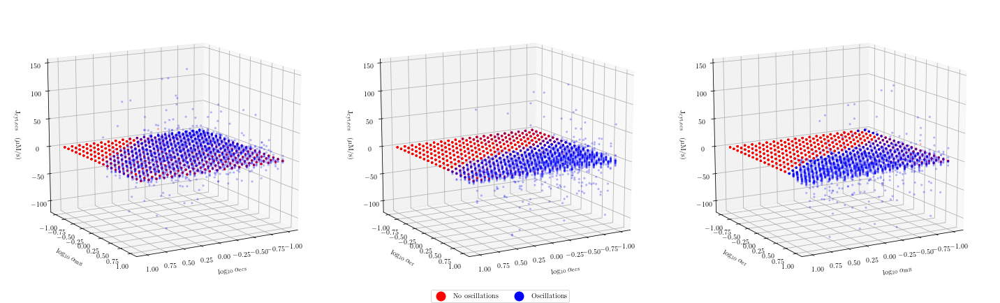

In [6]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

fig = plt.figure(figsize=(20,6))

ax = fig.add_subplot(1,3,1, projection='3d')

ax.scatter(sims.ecs[~sims.oscillations],
           sims.mit[~sims.oscillations],
           sims.J_ecs_mean[~sims.oscillations],
           c='r', marker='.',alpha=0.2, label='none')

ax.scatter(sims.ecs[sims.oscillations],
           sims.mit[sims.oscillations],
           sims.J_ecs_mean[sims.oscillations],
           c='b', marker='.',alpha=0.2, label='oscillations')

ax.set_xlabel(r'log$_{10}\ \alpha_{\text{ecs}}$',labelpad=10)
ax.set_ylabel(r'log$_{10}\ \alpha_{\text{mit}}$',labelpad=10)
ax.set_zlabel(r'J$_{\text{cyt,ecs}}\quad (\mu$M/s)',labelpad=10)
ax.view_init(15, 60)

ax = fig.add_subplot(1,3,2, projection='3d')
ax.scatter(sims.ecs[~sims.oscillations],
           sims.er[~sims.oscillations],
           sims.J_ecs_mean[~sims.oscillations],
           c='r', marker='.',alpha=0.2, label='none')

ax.scatter(sims.ecs[sims.oscillations],
           sims.er[sims.oscillations],
           sims.J_ecs_mean[sims.oscillations],
           c='b', marker='.',alpha=0.2, label='oscillations')

ax.set_xlabel(r'log$_{10}\ \alpha_{\text{ecs}}$',labelpad=10)
ax.set_ylabel(r'log$_{10}\ \alpha_{\text{er}}$',labelpad=10)
ax.set_zlabel(r'J$_{\text{cyt,ecs}}\quad (\mu$M/s)',labelpad=10)
ax.view_init(15, 60)

ax = fig.add_subplot(1,3,3, projection='3d')
ax.scatter(sims.mit[~sims.oscillations],
           sims.er[~sims.oscillations],
           sims.J_ecs_mean[~sims.oscillations],
           c='r', marker='.',alpha=0.2, label='none')

ax.scatter(sims.mit[sims.oscillations],
           sims.er[sims.oscillations],
           sims.J_ecs_mean[sims.oscillations],
           c='b', marker='.',alpha=0.2, label='oscillations')

ax.set_xlabel(r'log$_{10}\ \alpha_{\text{mit}}$',labelpad=10)
ax.set_ylabel(r'log$_{10}\ \alpha_{\text{er}}$',labelpad=10)
ax.set_zlabel(r'J$_{\text{cyt,ecs}}\quad (\mu$M/s)',labelpad=10)
ax.view_init(15, 60)

legend_elements = [ Line2D([0], [0], marker='o', color='w', label='No oscillations',
                          markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Oscillations',
                          markerfacecolor='blue', markersize=15)]

fig.legend(handles=legend_elements,
           loc='lower center',
           borderaxespad=0.1,
           ncol=2)

plt.tight_layout()

                   
#plt.savefig('Jcytecs.pdf')
#plt.savefig('Jcytecs.png',dpi=300)
#plt.show()


# Calcium extrusion out of mitochondria

In [7]:
# ER x MIT

oscillations = go.Scatter3d(
    x = sims.er[sims.oscillations],
    y = sims.mit[sims.oscillations],
    z = sims.J_mit_mean[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.er[~sims.oscillations],
    y = sims.mit[~sims.oscillations],
    z = sims.J_mit_mean[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='J_mit'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


In [8]:
# ECS x MIT

oscillations = go.Scatter3d(
    x = sims.ecs[sims.oscillations],
    y = sims.mit[sims.oscillations],
    z = sims.J_mit_mean[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.ecs[~sims.oscillations],
    y = sims.mit[~sims.oscillations],
    z = sims.J_mit_mean[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(ecs)',
                    yaxis_title='log(mit)',
                    zaxis_title='J_mit'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


In [9]:
# ER x ECS

oscillations = go.Scatter3d(
    x = sims.er[sims.oscillations],
    y = sims.ecs[sims.oscillations],
    z = sims.J_mit_mean[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.er[~sims.oscillations],
    y = sims.ecs[~sims.oscillations],
    z = sims.J_mit_mean[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(ecs)',
                    zaxis_title='J_mit'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


# Cytosolic calcium frequency

In [10]:
# ER x MIT

oscillations = go.Scatter3d(
    x = sims.er[sims.oscillations],
    y = sims.mit[sims.oscillations],
    z = sims.freq[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.er[~sims.oscillations],
    y = sims.mit[~sims.oscillations],
    z = sims.freq[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='freq'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


In [11]:
# ER x ECS

oscillations = go.Scatter3d(
    x = sims.er[sims.oscillations],
    y = sims.ecs[sims.oscillations],
    z = sims.freq[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.er[~sims.oscillations],
    y = sims.ecs[~sims.oscillations],
    z = sims.freq[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(ecs)',
                    zaxis_title='freq'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


In [12]:
# MIT x ECS

oscillations = go.Scatter3d(
    x = sims.mit[sims.oscillations],
    y = sims.ecs[sims.oscillations],
    z = sims.freq[sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = sims.mit[~sims.oscillations],
    y = sims.ecs[~sims.oscillations],
    z = sims.freq[~sims.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(mit)',
                    yaxis_title='log(ecs)',
                    zaxis_title='freq'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


# SVM

Remove outliers first

In [13]:
kde = KernelDensity(kernel='gaussian', bandwidth=0.1)
kde.fit(sims[['er','mit','ecs']][~sims.oscillations])
scores = kde.score_samples(sims[['er','mit','ecs']][~sims.oscillations])


In [14]:
no_osc = sims[['er','mit','ecs']][~sims.oscillations][scores>-2.5]
no_osc['oscillations'] = False
restricted = pd.concat([no_osc,sims[['er','mit','ecs','oscillations']][sims.oscillations]])
restricted.shape


(7920, 4)

In [15]:
restricted.reindex()
y = restricted['oscillations']

X_train, X_test, y_train, y_test = train_test_split(restricted[['er','mit','ecs']], y, test_size=0.1) # 70% training and 30% test


In [16]:

oscillations = go.Scatter3d(
    x = restricted.er[restricted.oscillations],
    y = restricted.mit[restricted.oscillations],
    z = restricted.ecs[restricted.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = restricted.er[~restricted.oscillations],
    y = restricted.mit[~restricted.oscillations],
    z = restricted.ecs[~restricted.oscillations],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='log(ecs)'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


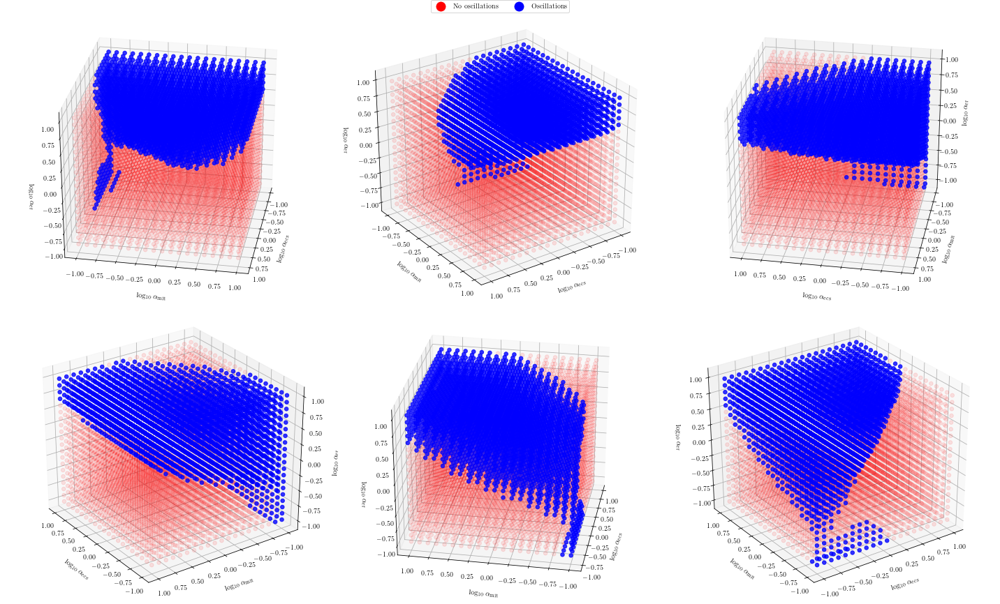

In [17]:
fig = plt.figure(figsize=(20,12))
for j in range(6):
    ax = fig.add_subplot(2,3,j+1, projection='3d')

    ax.scatter(sims.ecs[sims.oscillations],
           sims.mit[sims.oscillations],
           sims.er[sims.oscillations],
           c='b', marker='o',alpha=0.8, label='oscillations',s=30)
        
    ax.scatter(sims.ecs[~sims.oscillations],
               sims.mit[~sims.oscillations],
               sims.er[~sims.oscillations],
               c='r', marker='o',alpha=0.1, label='none',s=30)

    ax.set_xlabel(r'log$_{10}\ \alpha_{\text{ecs}}$',labelpad=10)
    ax.set_ylabel(r'log$_{10}\ \alpha_{\text{mit}}$',labelpad=10)
    ax.set_zlabel(r'log$_{10}\ \alpha_{\text{er}}$',labelpad=10)
    ax.view_init(30, 45*j+10)

legend_elements = [ Line2D([0], [0], marker='o', color='w', label='No oscillations',
                          markerfacecolor='red', markersize=15),
                   Line2D([0], [0], marker='o', color='w', label='Oscillations',
                          markerfacecolor='blue', markersize=15)]

fig.legend(handles=legend_elements,
           loc='upper center',
           borderaxespad=0.1,
           ncol=2)

plt.subplots_adjust(wspace=10, hspace=10)

plt.tight_layout()

plt.savefig('oscillation_region.pdf')
plt.savefig('oscillation_region.png',dpi=300)

plt.show()


In [18]:
svc3 = SVC(kernel="poly", degree=3, C=1e4)

svc3.fit(X_train,y_train)
y_pred = svc3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

/usr/local/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



Accuracy: 0.8939393939393939
Precision: 0.9570815450643777
Recall: 0.7508417508417509


In [19]:
svc2 = SVC(kernel="poly", degree=2)

svc2.fit(X_train,y_train)
y_pred = svc2.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

/usr/local/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



Accuracy: 0.6224747474747475
Precision: 0.4943181818181818
Recall: 0.29292929292929293


In [20]:
svc4 = SVC(kernel="poly", degree=4)

svc4.fit(X_train,y_train)
y_pred = svc4.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

/usr/local/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



Accuracy: 0.6186868686868687
Precision: 0.4675324675324675
Recall: 0.12121212121212122


In [21]:
svc_rbf = SVC(kernel="rbf",C=1e4)
svc_rbf.fit(X_train,y_train)
y_pred = svc_rbf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9987373737373737
Precision: 0.9966442953020134
Recall: 1.0


/usr/local/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [22]:
decisions = svc3.decision_function(svc3.support_vectors_)
x = svc3.support_vectors_[:,0]
y = svc3.support_vectors_[:,1]
z = svc3.support_vectors_[:,2]

oscillations = go.Scatter3d(
    x = x[decisions>0],
    y = y[decisions>0],
    z = z[decisions>0],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = x[decisions<0],
    y = y[decisions<0],
    z = z[decisions<0],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='log(ecs)'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


In [23]:
decisions = svc_rbf.decision_function(svc_rbf.support_vectors_)
x = svc_rbf.support_vectors_[:,0]
y = svc_rbf.support_vectors_[:,1]
z = svc_rbf.support_vectors_[:,2]

oscillations = go.Scatter3d(
    x = x[decisions>0],
    y = y[decisions>0],
    z = z[decisions>0],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "oscillations"
)

none = go.Scatter3d(
    x = x[decisions<0],
    y = y[decisions<0],
    z = z[decisions<0],
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 1,
        'color': 'rgba(255,0,0,1)'
    },
    name = "no oscillations",
    )

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(er)',
                    yaxis_title='log(mit)',
                    zaxis_title='log(ecs)'),
    legend=dict(x=-.1, y=1),
                    width=700,
)

data = [none,oscillations]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)


In [24]:
from scipy.spatial import ConvexHull

In [25]:
hull = ConvexHull(sims[['er','ecs','mit']][sims.oscillations])

In [26]:
hull_vertices = sims[['er','ecs','mit']][sims.oscillations].iloc[hull.vertices,:]
hull_vertices.head()

,er,ecs,mit
0,-1.000000,-1.000000,-1.000000
10,-1.000000,0.052632,-1.000000
20,-1.000000,-1.000000,-0.894737
25,-1.000000,-0.473684,-0.894737
5479,0.368421,1.000000,0.368421


In [27]:
# kill points along the faces

hull_vertices = hull_vertices[~(hull_vertices.er>0.97)]
hull_vertices = hull_vertices[~(hull_vertices.ecs<-0.97)]
hull_vertices = hull_vertices[~(hull_vertices.mit>0.97)]

In [28]:
def poly_matrix(x, y, order=2):
    """ generate Matrix use with lstsq """
    ncols = (order + 1)**2
    G = np.zeros((x.size, ncols))
    ij = itertools.product(range(order+1), range(order+1))
    for k, (i, j) in enumerate(ij):
        G[:, k] = x**i * y**j
    return G

ordr = 3  # order of polynomial
x, y, z = hull_vertices.mit, hull_vertices.ecs, hull_vertices.er

In [29]:
# make Matrix:
G = poly_matrix(x, y, ordr)
# Solve for np.dot(G, m) = z:
m = np.linalg.lstsq(G, z)[0]


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

`rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.



In [30]:
# Evaluate it on a grid...
nx, ny = 30, 30
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
GG = poly_matrix(xx.ravel(), yy.ravel(), ordr)
zz = np.reshape(np.dot(GG, m), xx.shape)

surfpts = np.array([xx.flatten(),yy.flatten(),zz.flatten()]).T
#surfpts = surfpts[surfpts[:,2]<1]

In [31]:
surfpts=surfpts[surfpts[:,2]<1]

In [32]:

hullplt = go.Scatter3d(
    z = hull_vertices.er,
    y = hull_vertices.ecs,
    x = hull_vertices.mit,
    mode = 'markers',
    marker={
        'size': 3,
        'opacity': 0.9,
        'color': 'rgba(0,0,255,0.6)'
    },
    name = "hull"
)

surfaceplt = go.Surface(
    z = zz,
    y = np.linspace(y.min(), y.max(), ny),
    x = np.linspace(x.min(), x.max(), nx),
    opacity=0.5,
    name ='quadratic'
)


# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene = dict(
                    xaxis_title='log(mit)',
                    yaxis_title='log(ecs)',
                    zaxis_title='log(er)',
        zaxis = dict(range=[-1,1])
    ),
    legend=dict(x=-.1, y=1),
                    width=700,
    
)

data = [hullplt,surfaceplt]

plot_figure = go.Figure(data=data, layout=layout)

plotly.offline.iplot(plot_figure)



In [33]:
m.shape

(16,)

In [34]:
GG.shape

(900, 16)